In [1]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

from collections import Counter
from nilearn import datasets
from mne_bids import BIDSPath
from nilearn.plotting import plot_markers
from utils import (
    calculate_pvalues,
    generate_null_dist,
    fetch_atlas_glasser_2016,
    get_coord_atlas_labels,
    get_sub_coords,
)
from statsmodels.stats.multitest import multipletests

In [2]:
models = ['spectral', 'phonetic', 'syntactic', 'en.core.web.lg', 'gpt2.xl.l24']

In [3]:
model_results = []

for modelname in models:
    result_path = BIDSPath(
        root="../results",
        datatype="encoding",
        description=modelname,
        extension=".h5",
        check=False,
    )
    result_files = result_path.match()
    assert len(result_files) > 0

    sub_scores = []
    for result_path in result_files:
        result_path.update(description=modelname)
        with h5py.File(result_path, "r") as f:
            scores = f['scores'][...]
            lags = f['lags'][...]

            sub_scores.append(scores)

    sub_scores = np.vstack([s.mean(0) for s in sub_scores])
    print(modelname, sub_scores.shape, lags.shape)
    model_results.append(sub_scores)

spectral (1159, 128) (129,)
phonetic (1159, 128) (129,)
syntactic (1159, 128) (129,)
en.core.web.lg (1159, 128) (129,)
gpt2.xl.l24 (1159, 128) (129,)


In [4]:
lags = np.arange(-512 * 2, 512 * 2, 16)
lags.shape

(128,)

In [5]:
coords = get_sub_coords()
coords.shape

(1159, 3)

## atlas and coords

In [64]:
atlas = datasets.fetch_atlas_destrieux_2009()
indices = atlas['labels'].index
names = atlas['labels'].name
atlas_labels = {idx: name for idx, name in zip(indices, names)}

In [55]:
atlas = datasets.fetch_atlas_schaefer_2018(n_rois=100, resolution_mm=1, yeo_networks=17)
atlas_labels = ['background'] + [l.decode() for l in atlas['labels']]

In [6]:
atlas = fetch_atlas_glasser_2016()
atlas_labels = atlas['labels'].to_dict()['label']

/scratch/gpfs/zzada/conda-envs/mne/lib/python3.12/site-packages/nilearn/datasets/_utils.py:675: UserWarning: Could not find dataset description.
  warnings.warn("Could not find dataset description.")


In [7]:
import sys
from importlib import reload
reload(sys.modules['utils'])

from utils import get_coord_atlas_labels

In [66]:
original_elec_labels = get_coord_atlas_labels(coords, atlas['maps'], atlas_labels)

In [65]:
# elec_labels = [label.split("_")[1] for label in elec_labels]  # for glasser
elec_labels = [label.split()[1].split("_", 1)[1] for label in original_elec_labels]  # for destrieux
# elec_labels = [label.split("_", 2)[-1].split("_")[1] for label in elec_labels]  # for schaefer
# elec_labels = [label.split("_", 2)[-1].split("_")[0] for label in elec_labels]  # for kong networks
# elec_labels = [label.split("_", 2)[-1] for label in elec_labels]  # for schaefer, just remove network and hemi

In [67]:
counter = Counter(elec_labels)
top_rois = counter.most_common(16)
top_rois

[('temp_sup-Lateral', 120),
 ('precentral', 107),
 ('front_middle', 99),
 ('temporal_middle', 82),
 ('postcentral', 72),
 ('pariet_inf-Supramar', 61),
 ('and_S_subcentral', 55),
 ('front_inf-Triangul', 52),
 ('front_inf-Opercular', 45),
 ('oc-temp_med-Parahip', 44),
 ('pariet_inf-Angular', 41),
 ('temporal', 34),
 ('circular_insula_inf', 34),
 ('front_sup', 25),
 ('orbital', 24),
 ('temporal_inf', 23)]

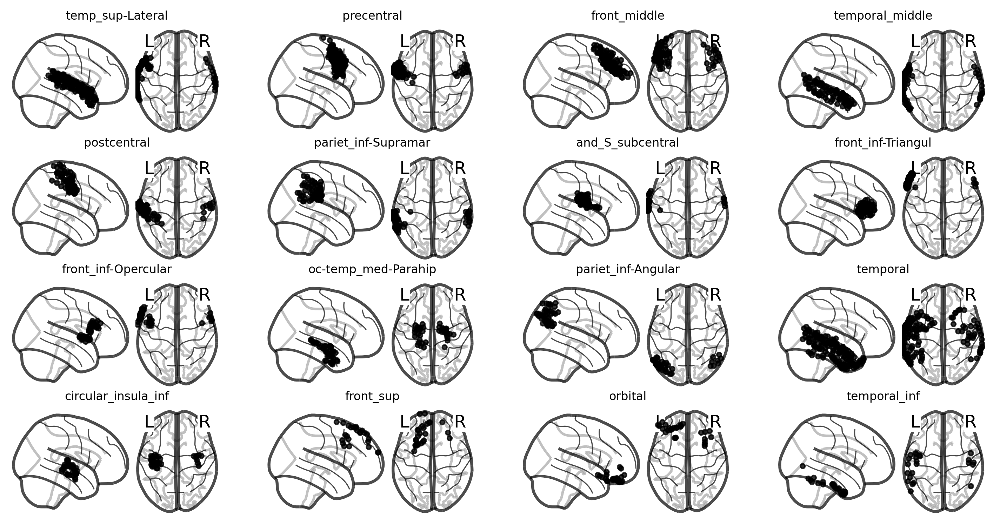

In [13]:
fig, axes = plt.subplots(4, 4, sharex=True, sharey=True, dpi=300, figsize=(12, 6))

for (roi, count), ax in zip(top_rois, axes.ravel()):

    roi_mask = np.array([roi in label for label in elec_labels])
    roi_coords = coords[roi_mask]
    scores = np.ones(len(roi_coords))

    plot_markers(scores, coords[roi_mask],
                node_size=10, display_mode='xz',
                alpha=0.8, colorbar=False,
                node_cmap='Grays', node_vmin=0, node_vmax=1,
                figure=fig, axes=ax)

    ax.set_title(roi, fontsize=8)
fig.show()

# unthresholded results

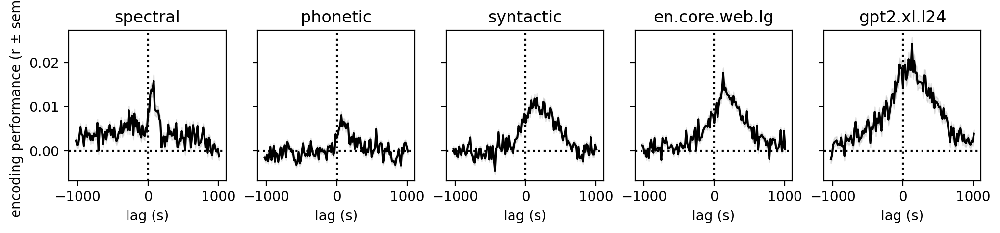

In [6]:
fig, axes = plt.subplots(1, 5, figsize=(12, 2), dpi=200, sharex=True, sharey=True)

for modelname, sub_scores, ax in zip(models, model_results, axes):
    mean = sub_scores.mean(0)
    err = sub_scores.std(0) / np.sqrt(sub_scores.shape[0])

    ax.axvline(0, c='k', ls=':')
    ax.axhline(0, c='k', ls=':')

    ax.fill_between(lags, mean - err, mean + err, alpha=0.1, color='k')
    ax.plot(lags, mean, color='k', label=f"N={len(sub_scores)}")
    ax.set_xlabel("lag (s)")
    ax.set_title(modelname)

axes[0].set_ylabel("encoding performance (r ± sem)")

fig.show()

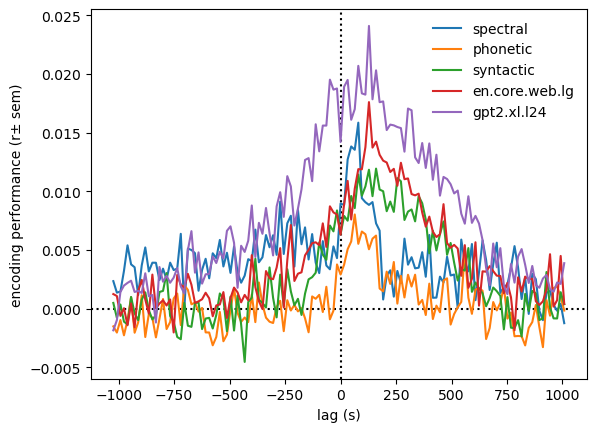

In [7]:
fig, ax = plt.subplots()

ax.axvline(0, c='k', ls=':')
ax.axhline(0, c='k', ls=':')

for modelname, sub_scores in zip(models, model_results):
    mean = sub_scores.mean(0)
    # err = sub_scores.std(0) / np.sqrt(sub_scores.shape[0])
    # ax.fill_between(lags, mean - err, mean + err, alpha=0.1, color='k')
    ax.plot(lags, mean, label=modelname)

ax.set_xlabel("lag (s)")
ax.set_ylabel("encoding performance (r± sem)")
ax.legend(frameon=False, loc='best')
fig.show()

In [14]:
rois = [
    "temp_sup-Lateral",
    "G_front_inf-Triangul",
    "G_front_inf-Opercular",
    "G_front_inf-Orbital",
    "front_middle",
    "subcentral",
    "pariet_inf-Supramar",
    "pariet_inf-Angular",
    # "Pole_temporal",
]

/tmp/ipykernel_4168896/2307422945.py:13: RuntimeWarning: Mean of empty slice.
  mean = sub_scores[roi_mask].mean(0)
/scratch/gpfs/zzada/conda-envs/mne/lib/python3.12/site-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


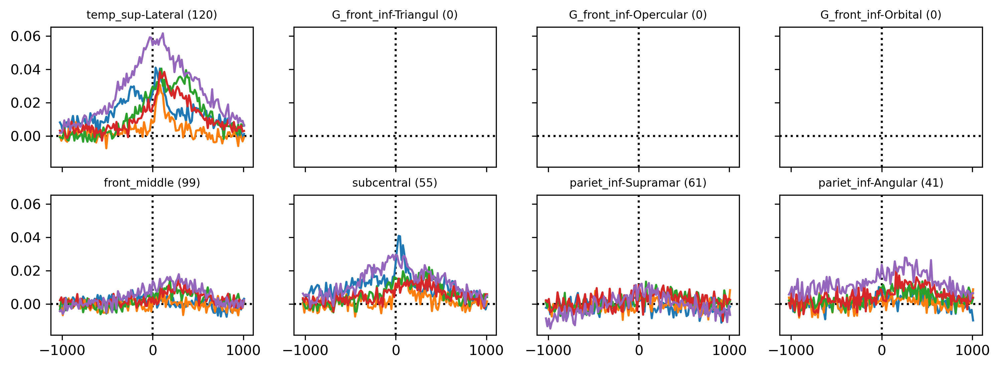

In [15]:
fig, axes = plt.subplots(2, 4, sharex=True, sharey=True, dpi=300, figsize=(12, 4))

for roi, ax in zip(rois, axes.ravel()):

    roi_mask = np.array([roi in label for label in elec_labels])
    count = roi_mask.sum()

    ax.axvline(0, c='k', ls=':')
    ax.axhline(0, c='k', ls=':')
    ax.set_title(f'{roi} ({count})', fontsize=8)

    for modelname, sub_scores in zip(models, model_results):
        mean = sub_scores[roi_mask].mean(0)
        # err = sub_scores.std(0) / np.sqrt(sub_scores.shape[0])
        # ax.fill_between(lags, mean - err, mean + err, alpha=0.1, color='k')
        ax.plot(lags, mean, label=modelname)

    # ax.set_xlabel("lag (s)")
    # ax.set_ylabel("encoding performance (r± sem)")
    # ax.legend(frameon=False, loc='best')

fig.show()

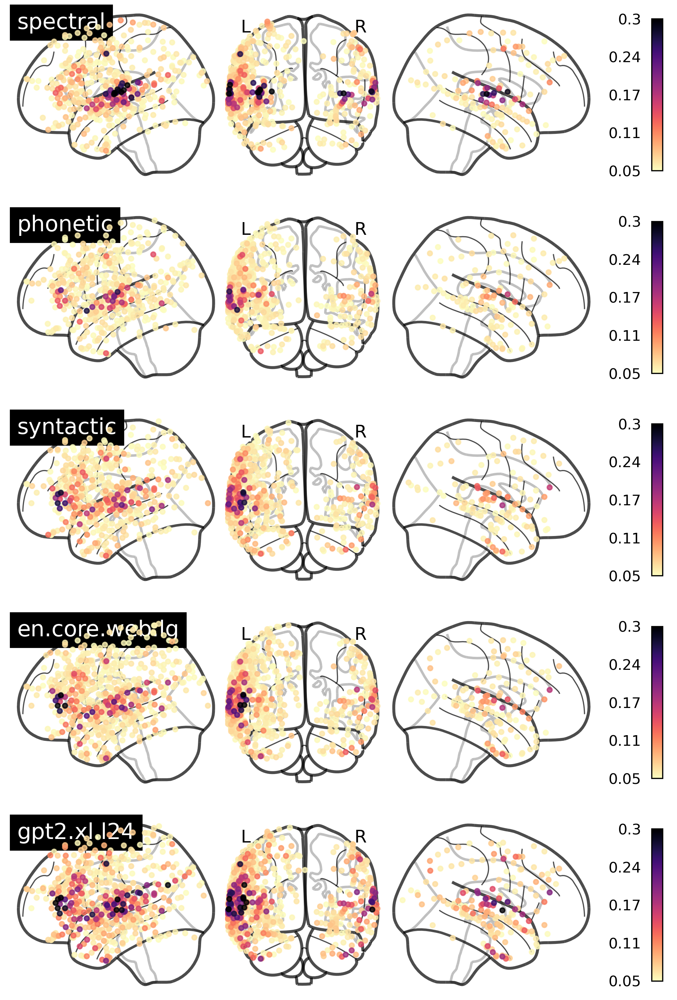

In [8]:
fig, axes = plt.subplots(5, 1, figsize=(8, 12), dpi=300)

for modelname, sub_scores, ax in zip(models, model_results, axes):
    scores = sub_scores.max(-1)

    vmin = .05
    vmax = np.quantile(scores, .99)
    vmax = 0.3
    # print(vmin, vmax)

    order = scores.argsort()
    plot_markers(scores[order], coords[order],
                node_size=10, display_mode='lyr',
                node_cmap='magma_r', colorbar=True,
                alpha=0.8, 
                node_threshold=vmin,
                title=modelname,
                node_vmin=vmin, node_vmax=vmax,
                figure=fig, axes=ax)
fig.show()

# sig thresholded

In [18]:
null_dist = generate_null_dist()
null_dist.shape

(10000,)

In [19]:
model_sigmasks = []
for modelname, sub_scores in zip(models, model_results):
    scores = sub_scores.max(-1)

    p_values = calculate_pvalues(scores.reshape(-1, 1), null_dist, alternative='greater')
    fdr_out = multipletests(p_values, alpha=.05, method='fdr_by')
    sigmask = fdr_out[0]
    print(modelname, sigmask.sum())
    model_sigmasks.append(sigmask)

common_sigmask = np.stack(model_sigmasks).all(0)
print("common", common_sigmask.sum())

spectral 429
phonetic 454
syntactic 467
glove.300 699
gpt2.xl.l24 770
common 139


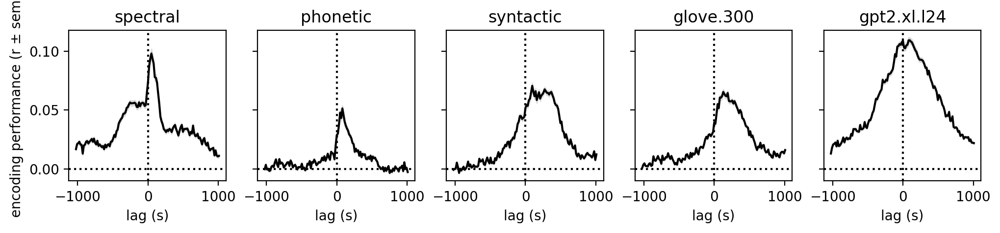

In [20]:
fig, axes = plt.subplots(1, 5, figsize=(12, 2), dpi=200, sharex=True, sharey=True)

for modelname, sub_scores, sigmask, ax in zip(models, model_results, model_sigmasks, axes):
    mean = sub_scores[common_sigmask].mean(0)
    err = sub_scores[common_sigmask].std(0) / np.sqrt(sigmask.sum())

    ax.axvline(0, c='k', ls=':')
    ax.axhline(0, c='k', ls=':')

    ax.fill_between(lags, mean - err, mean + err, alpha=0.1, color='k')
    ax.plot(lags, mean, color='k', label=f"N={sigmask.sum()}")
    ax.set_xlabel("lag (s)")
    ax.set_title(modelname)
    # ax.legend(frameon=False, loc='upper left')

axes[0].set_ylabel("encoding performance (r ± sem)")

fig.show()

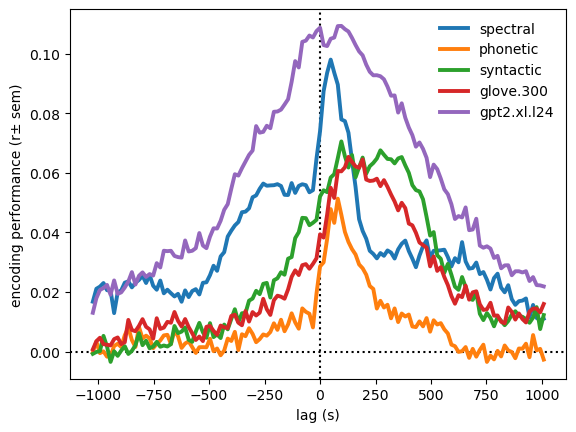

In [21]:
fig, ax = plt.subplots()

ax.axvline(0, c='k', ls=':')
ax.axhline(0, c='k', ls=':')

for modelname, sub_scores in zip(models, model_results):
    mean = sub_scores[common_sigmask].mean(0)
    # err = sub_scores.std(0) / np.sqrt(sub_scores.shape[0])
    # ax.fill_between(lags, mean - err, mean + err, alpha=0.1, color='k')
    ax.plot(lags, mean, label=modelname, lw=2.8)

ax.set_xlabel("lag (s)")
ax.set_ylabel("encoding performance (r± sem)")
ax.legend(frameon=False, loc='best')
fig.show()

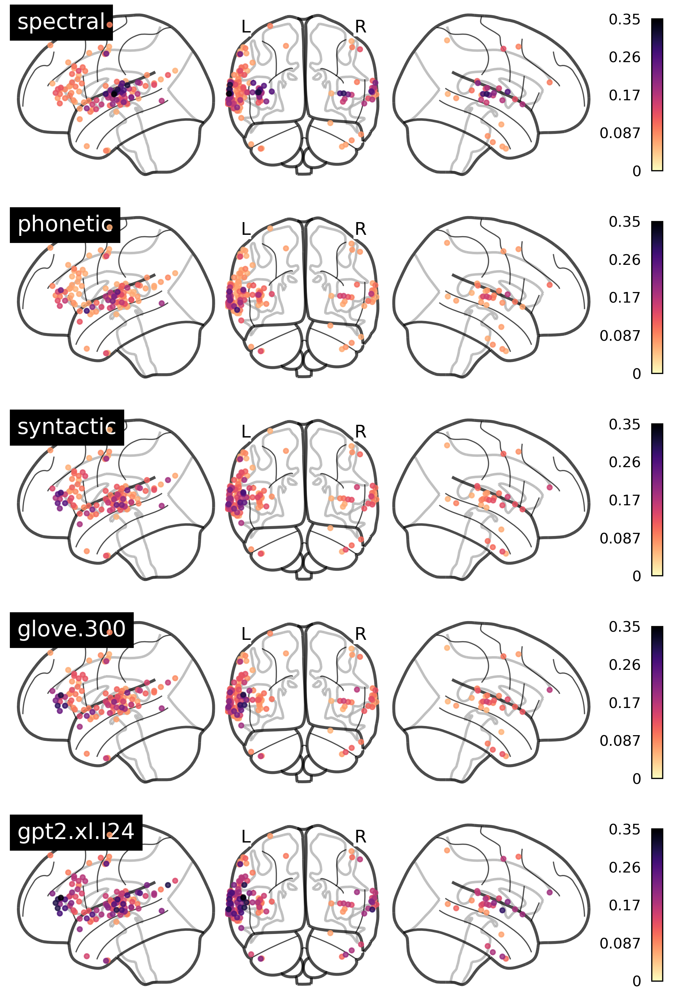

In [22]:
fig, axes = plt.subplots(5, 1, figsize=(8, 12), dpi=300)

for modelname, sub_scores, ax in zip(models, model_results, axes):
    scores = sub_scores[common_sigmask].max(-1)
    sig_coords = coords[common_sigmask]

    # vmin, vmax = .05, np.quantile(scores, .99)
    # print(vmin, vmax)
    vmin, vmax = 0.0, 0.35

    order = scores.argsort()
    plot_markers(scores[order], sig_coords[order],
                node_size=10, display_mode='lyr',
                node_cmap='magma_r', colorbar=True,
                alpha=0.8, 
                node_threshold=vmin,
                title=modelname,
                node_vmin=vmin, node_vmax=vmax,
                figure=fig, axes=ax)
fig.show()

## per ROI

In [68]:
counter = Counter(np.array(elec_labels)[common_sigmask].tolist())
sig_rois = counter.keys()
len(counter), counter

(20,
 Counter({'temp_sup-Lateral': 40,
          'front_inf-Triangul': 17,
          'front_inf-Opercular': 10,
          'and_S_subcentral': 10,
          'precentral': 10,
          'temp_sup-G_T_transv': 9,
          'circular_insula_inf': 7,
          'front_middle': 6,
          'Ins_lg_and_S_cent_ins': 6,
          'pariet_inf-Supramar': 4,
          'temporal_inf': 4,
          'temporal': 3,
          'temporal_middle': 3,
          'pariet_inf-Angular': 3,
          'Fis-post': 2,
          'temp_sup-Plan_tempo': 1,
          'temporal_transverse': 1,
          'oc-temp_med-Parahip': 1,
          'calcarine': 1,
          'front_sup': 1}))

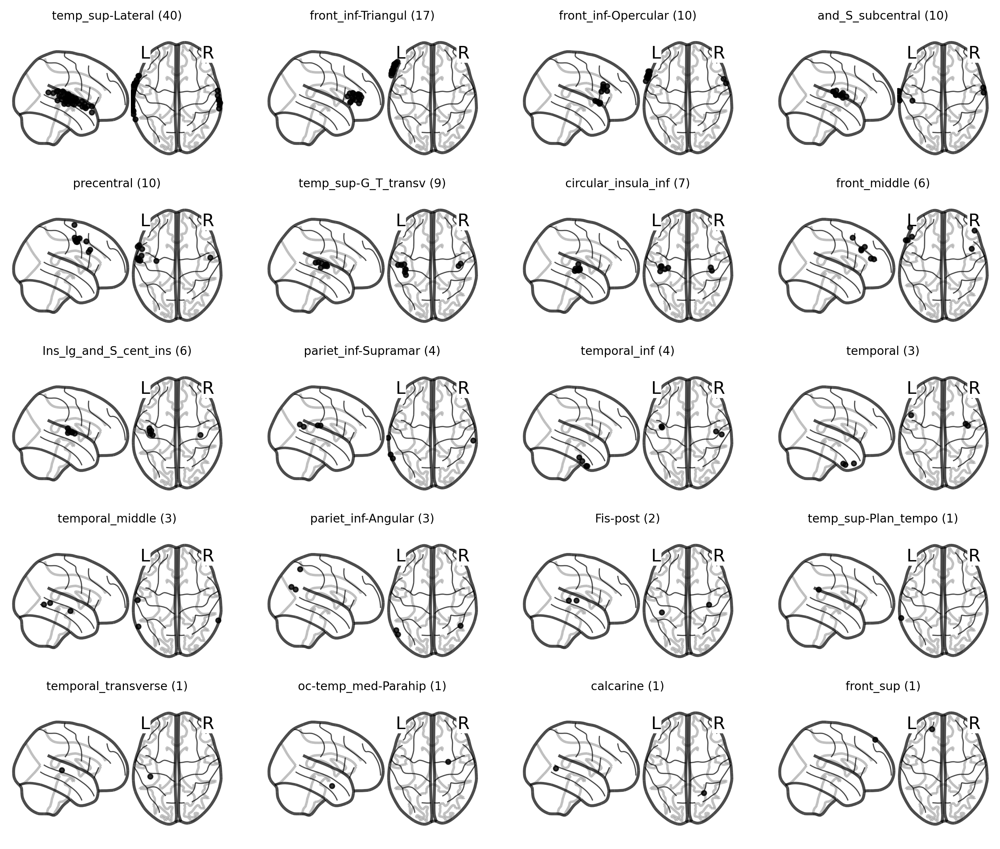

In [116]:
fig, axes = plt.subplots(5, 4, sharex=True, sharey=True, dpi=300, figsize=(12, 10))

for (roi, count), ax in zip(counter.most_common(20), axes.ravel()):

    roi_mask = np.array([roi == label for label in elec_labels])
    roi_mask &= common_sigmask
    roi_coords = coords[roi_mask]
    scores = np.ones(len(roi_coords))

    plot_markers(scores, coords[roi_mask],
                node_size=10, display_mode='xz',
                alpha=0.8, colorbar=False,
                node_cmap='Grays', node_vmin=0, node_vmax=1,
                figure=fig, axes=ax)

    ax.set_title(f"{roi} ({count})", fontsize=8)
fig.show()

In [72]:
ROIs = {
    'EAC': ['and_S_subcentral',  'temp_sup-G_T_transv', 'circular_insula_inf', 'Ins_lg_and_S_cent_ins', 'temporal_transverse'],
    'STG': ['temp_sup-Lateral'],
    'IFG': ['front_inf-Triangul', 'front_inf-Opercular'],
    'MFG': ['front_middle', 'precentral'],
    'SMG': ['pariet_inf-Supramar', 'temp_sup-Plan_tempo'],
    'ANG': ['pariet_inf-Angular'],
    'TMP': ['temporal', 'temporal_inf']
}

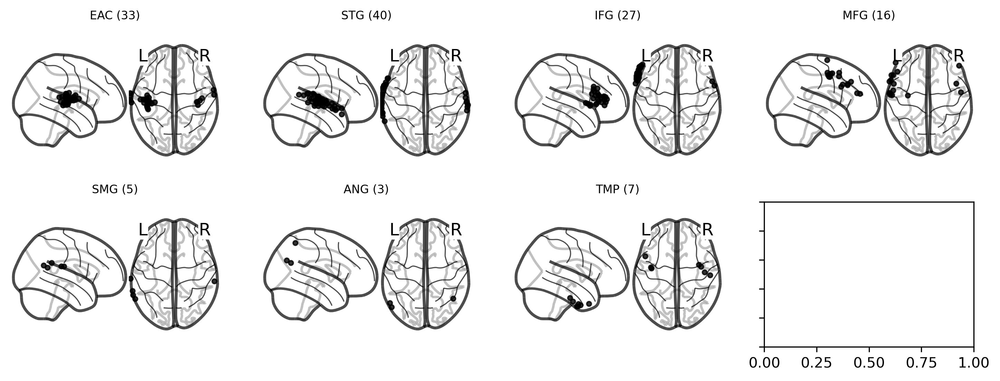

In [120]:
fig, axes = plt.subplots(2, 4, sharex=True, sharey=True, dpi=300, figsize=(12, 4))

for (roi, roi_labels), ax in zip(ROIs.items(), axes.ravel()):

    roi_mask = np.isin(elec_labels, roi_labels)
    roi_mask &= common_sigmask
    roi_coords = coords[roi_mask]
    count = roi_mask.sum()
    scores = np.ones(len(roi_coords))

    plot_markers(scores, coords[roi_mask],
                node_size=10, display_mode='xz',
                alpha=0.8, colorbar=False,
                node_cmap='Grays', node_vmin=0, node_vmax=1,
                figure=fig, axes=ax)

    ax.set_title(f"{roi} ({count})", fontsize=8)
fig.show()

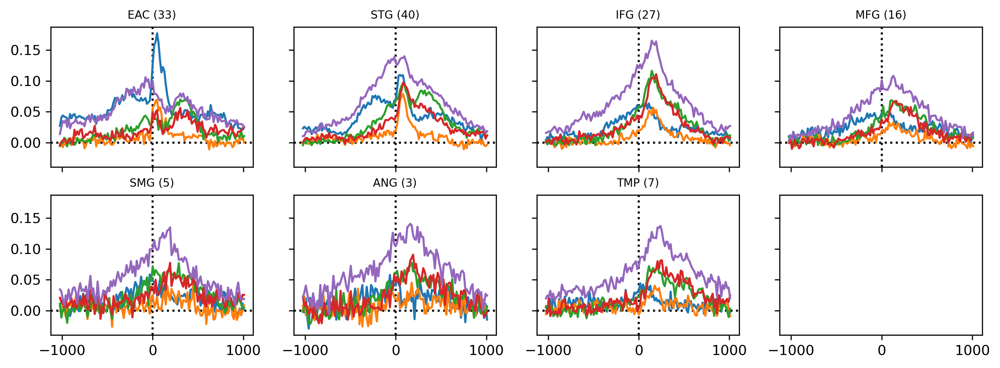

In [79]:
fig, axes = plt.subplots(2, 4, sharex=True, sharey=True, dpi=300, figsize=(12, 4))

for roi, ax in zip(ROIs, axes.ravel()):

    roi_mask = np.isin(elec_labels, ROIs[roi])
    roi_mask &= common_sigmask
    count = roi_mask.sum()

    ax.axvline(0, c='k', ls=':')
    ax.axhline(0, c='k', ls=':')
    ax.set_title(f'{roi} ({count})', fontsize=8)

    for modelname, sub_scores in zip(models, model_results):
        mean = sub_scores[roi_mask].mean(0)
        # err = sub_scores.std(0) / np.sqrt(sub_scores.shape[0])
        # ax.fill_between(lags, mean - err, mean + err, alpha=0.1, color='k')
        ax.plot(lags, mean, label=modelname)

    # ax.set_xlabel("lag (s)")
    # ax.set_ylabel("encoding performance (r± sem)")
    # ax.legend(frameon=False, loc='best')

fig.show()

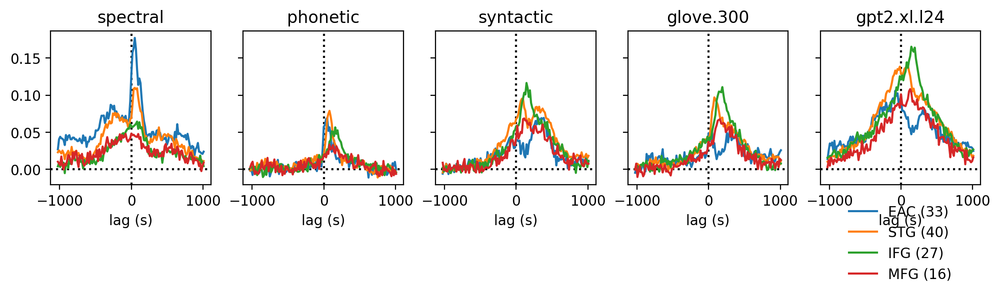

In [100]:
fig, axes = plt.subplots(1, 5, figsize=(12, 2), dpi=200, sharex=True, sharey=True)

for modelname, sub_scores, ax in zip(models, model_results, axes):

    ax.axvline(0, c='k', ls=':')
    ax.axhline(0, c='k', ls=':')
    ax.set_xlabel("lag (s)")
    ax.set_title(modelname)

    for roi, roi_labels in list(ROIs.items())[:4]:

        roi_mask = np.isin(elec_labels, roi_labels)
        roi_mask &= common_sigmask

        mean = sub_scores[roi_mask].mean(0)
        # err = sub_scores[roi_mask].std(0) / np.sqrt(roi_mask.sum())
        # ax.fill_between(lags, mean - err, mean + err, alpha=0.1, color='k')
        ax.plot(lags, mean, label=f"{roi} ({roi_mask.sum()})")

ax.legend(frameon=False, loc='upper center', bbox_to_anchor=(0.5, -0.05))

# axes[0].set_ylabel("encoding performance (r ± sem)")

fig.show()

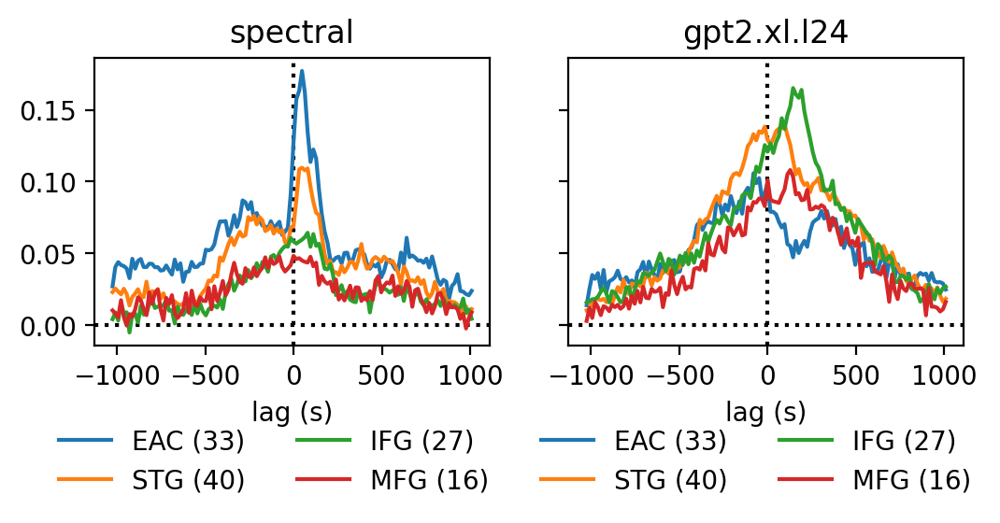

In [115]:
fig, axes = plt.subplots(1, 2, figsize=(6, 2), dpi=200, sharex=True, sharey=True)

sub_models = [models[0], models[-1]]
sub_results = [model_results[0], model_results[-1]]

for modelname, sub_scores, ax in zip(sub_models, sub_results, axes):

    ax.axvline(0, c='k', ls=':')
    ax.axhline(0, c='k', ls=':')
    ax.set_xlabel("lag (s)")
    ax.set_title(modelname)

    for roi, roi_labels in list(ROIs.items())[:4]:

        roi_mask = np.isin(elec_labels, roi_labels)
        roi_mask &= common_sigmask

        mean = sub_scores[roi_mask].mean(0)
        # err = sub_scores[roi_mask].std(0) / np.sqrt(roi_mask.sum())
        # ax.fill_between(lags, mean - err, mean + err, alpha=0.1, color='k')
        ax.plot(lags, mean, label=f"{roi} ({roi_mask.sum()})")

fig.legend(frameon=False, loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=4)

# axes[0].set_ylabel("encoding performance (r ± sem)")

fig.show()

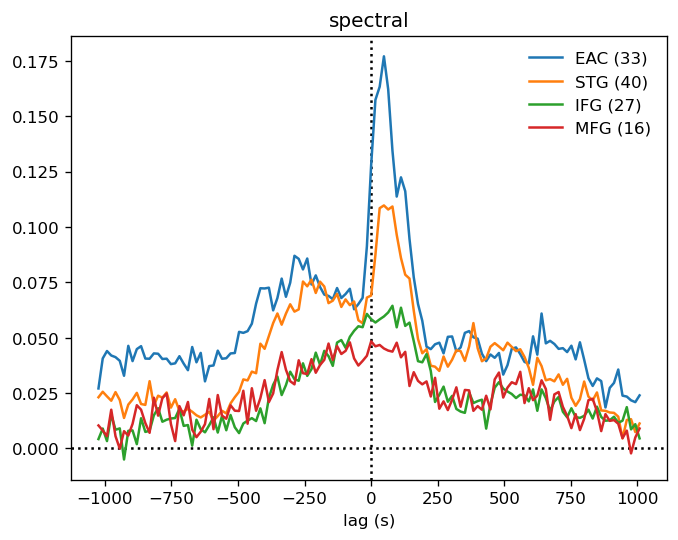

In [110]:
fig, ax = plt.subplots(dpi=120)

modelname = models[0]
sub_scores = model_results[0]

ax.axvline(0, c='k', ls=':')
ax.axhline(0, c='k', ls=':')
ax.set_xlabel("lag (s)")
ax.set_title(modelname)

for roi, roi_labels in list(ROIs.items())[:4]:

    roi_mask = np.isin(elec_labels, roi_labels)
    roi_mask &= common_sigmask

    mean = sub_scores[roi_mask].mean(0)
    # err = sub_scores[roi_mask].std(0) / np.sqrt(roi_mask.sum())
    # ax.fill_between(lags, mean - err, mean + err, alpha=0.1, color='k')
    ax.plot(lags, mean, label=f"{roi} ({roi_mask.sum()})")

ax.legend(frameon=False)#, loc='upper center', bbox_to_anchor=(0.5, -0.05))

fig.show()